## CNN implementation

## 1. Load Libraries

In [ ]:

from google.colab import drive
drive.mount('/content/gdrive')
%matplotlib inline
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import math
import copy
import numpy as np
!pip install keras_vggface
!pip install keras_applications
!pip install keras.engine.topology
!pip install np_utils
!pip install tensorflow
from keras.utils.layer_utils import get_source_inputs
from keras.utils import get_source_inputs
from keras.utils.layer_utils import get_source_inputs
from tensorflow import keras
#import tensorflow as tf
#from tensorflow.keras import layers
#from keras import utils as np_utils
#import tensorflow.keras
from keras.utils.np_utils import to_categorical
#from tensorflow.keras.layers import Layer, InputSpec
from tensorflow.python.keras.layers import Layer, InputSpec
#from keras.models import Sequential, Model
#from keras.engine.topology import get_source_inputs
#from keras.layers import Input, Dense, Flatten, Dropout, Activation, Lambda, Permute, Reshape
from keras_vggface.vggface import VGGFace
from keras_vggface import utils
from keras.preprocessing import image
from sklearn.datasets import load_files       
from keras.utils import np_utils
import numpy as np
from glob import glob
import pandas as pd
import cv2
import scipy.misc
import matplotlib.pyplot as plt
%matplotlib inline

## 2. Load Dataset

In [ ]:

# define function to load train, test, and validation datasets
def load_dataset(path):
    """
    Loads the images from path.
    
    Args
    ----------
    path : String
        Holds the path of the dataset

    Returns
    -------
    Array
        Two numpy arrays that holds the images and the targets.
    """
    data = load_files(path)
    face_files = np.array(data['filenames'])
    face_targets = np_utils.to_categorical(np.array(data['target']), 2)
    return face_files, face_targets

# load train, test, and validation datasets
train_files, train_targets = load_dataset('/content/gdrive/MyDrive/DATASET/facesResNet/train')
valid_files, valid_targets = load_dataset('/content/gdrive/MyDrive/DATASET/facesResNet/valid')
test_files, test_targets = load_dataset('/content/gdrive/MyDrive/DATASET/facesResNet/test')


# load list of dog names
face_names = [item[20:-1] for item in sorted(glob("/content/gdrive/MyDrive/DATASET/facesResNet/train/*/"))]

# print statistics about the dataset
print('There are %d total face names.' % len(face_names))
print('There are %s total face images.\n' % len(np.hstack([train_files, valid_files, test_files])))
print('There are %d training face images.' % len(train_files))
print('There are %d validation face images.' % len(valid_files))
print('There are %d test face images.'% len(test_files))


There are 2 total face names.
There are 553 total face images.

There are 191 training face images.
There are 181 validation face images.
There are 181 test face images.


## Extracting faces from train videos

1


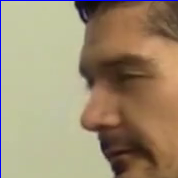

2


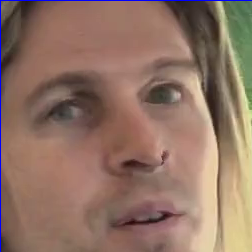

3


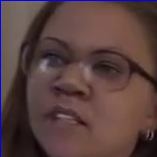

4


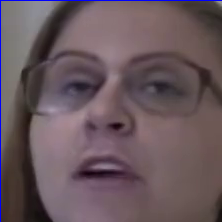

5


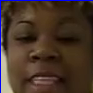

6


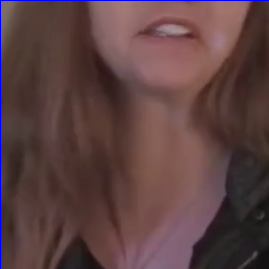

7


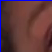

8


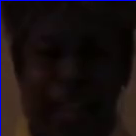

9


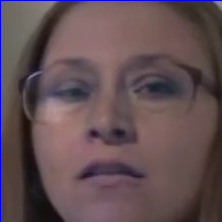

10


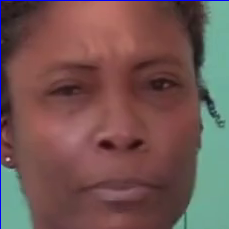

11


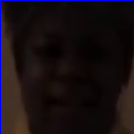

12


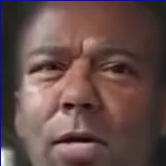

13


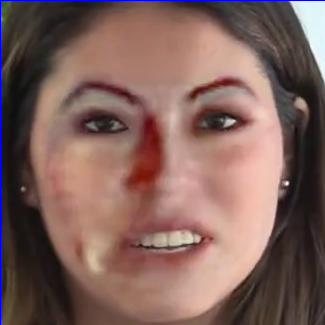

14


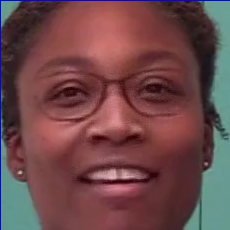

15


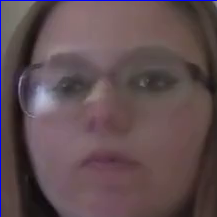

16


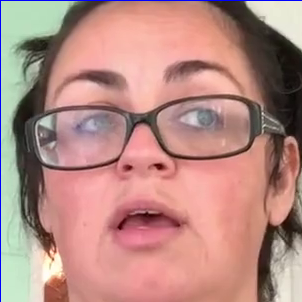

17


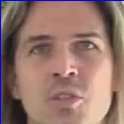

18


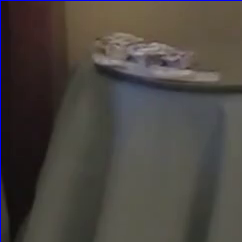

19


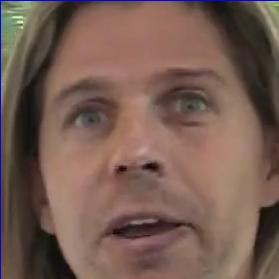

20


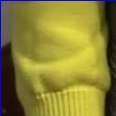

21


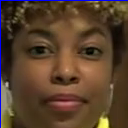

22


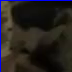

23


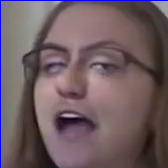

24


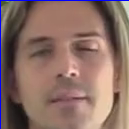

25


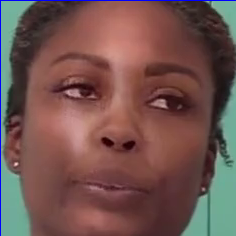

26


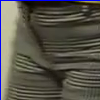

27


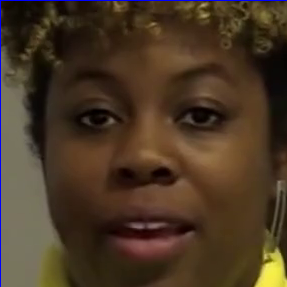

28


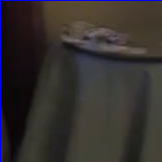

29


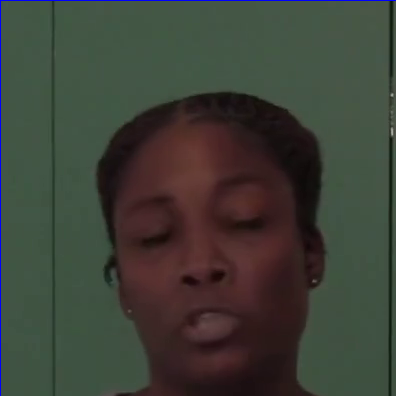

30


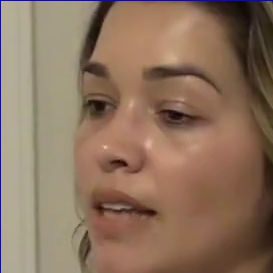

31


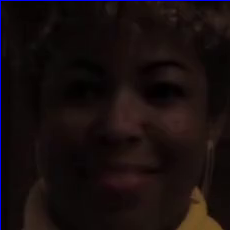

32


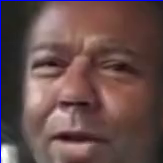

33


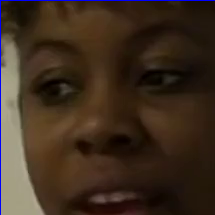

34


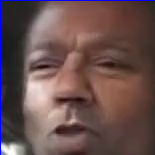

35


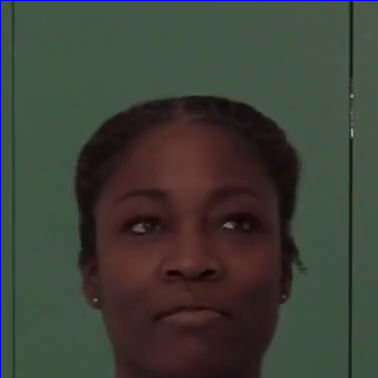

36


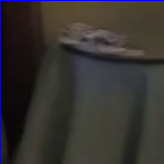

37


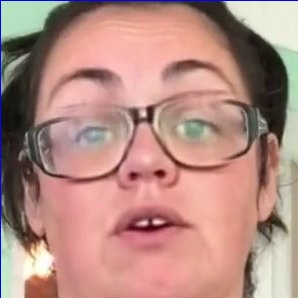

38


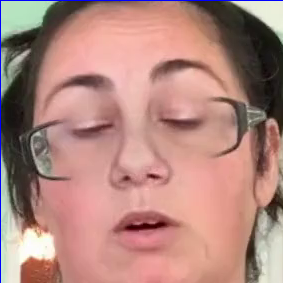

39


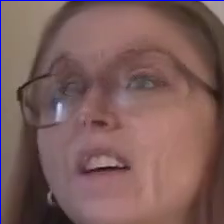

40
41


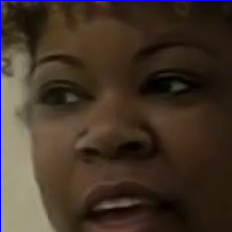

42


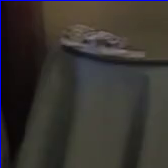

43


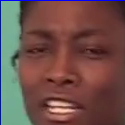

44


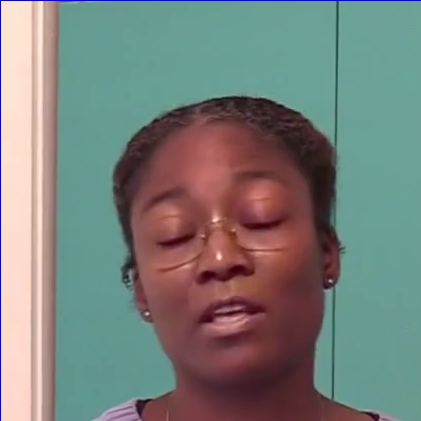

45


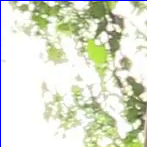

46


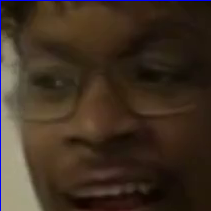

47


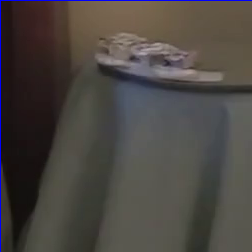

48


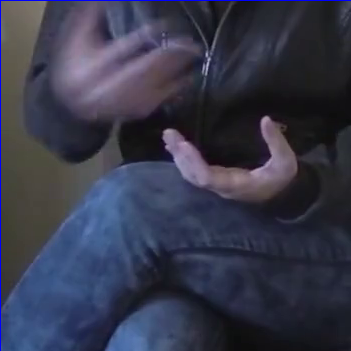

49


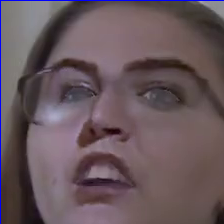

50


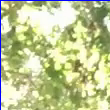

51


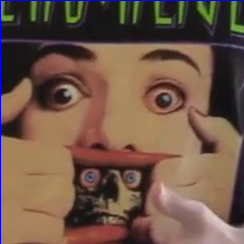

52
53


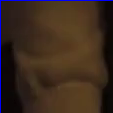

54


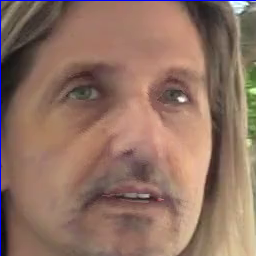

55


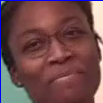

56


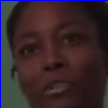

57


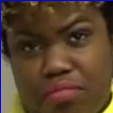

58
59


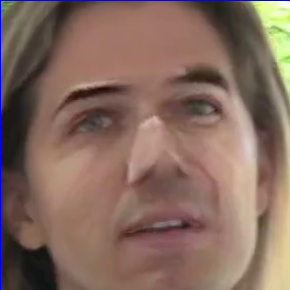

60


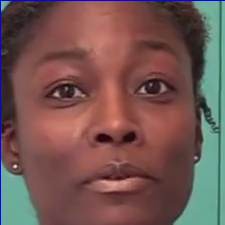

61


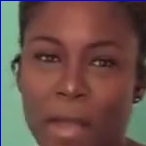

62


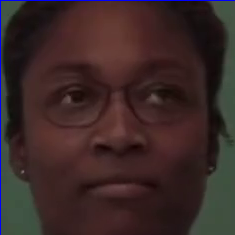

63


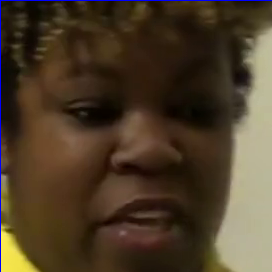

64


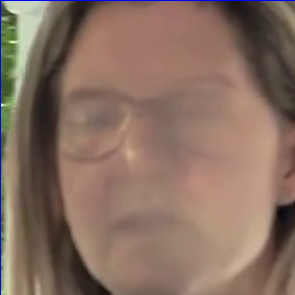

65


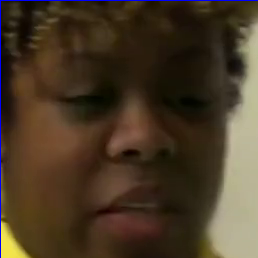

66


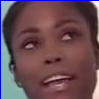

67


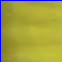

68


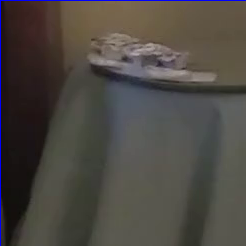

69


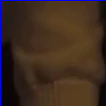

70


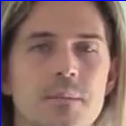

71
72


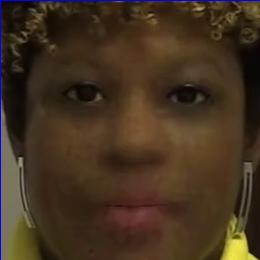

73


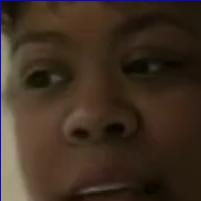

74


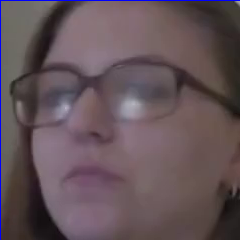

75


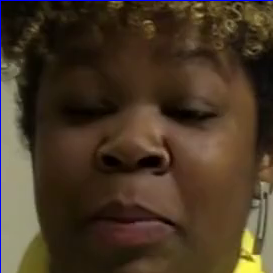

76


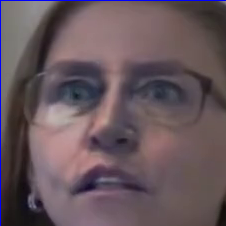

77


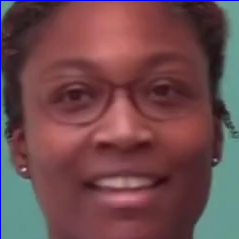

78


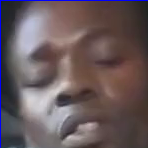

79
80


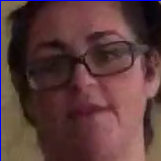

81


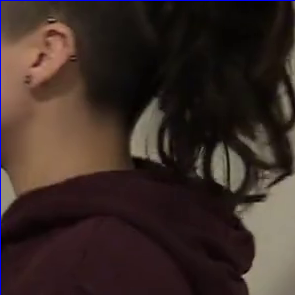

82


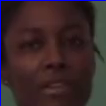

83


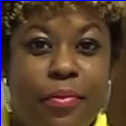

84


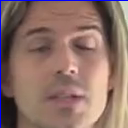

85
86


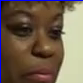

87


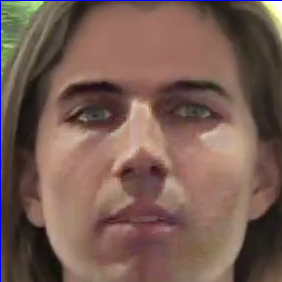

88


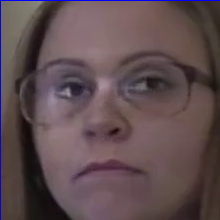

89


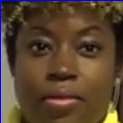

90


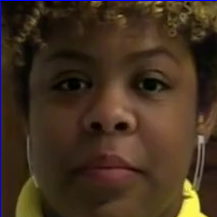

91


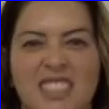

92


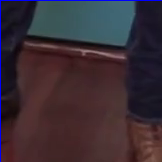

93


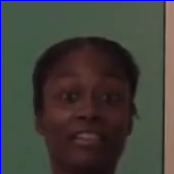

94
95


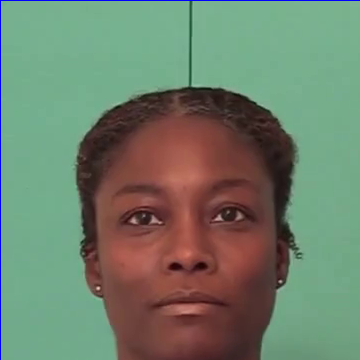

96


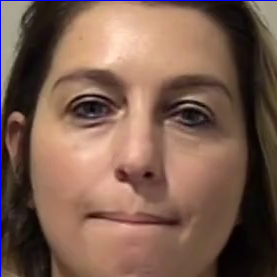

97


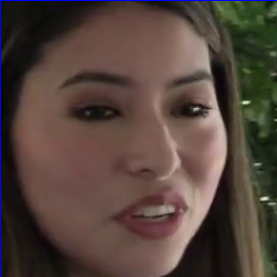

98


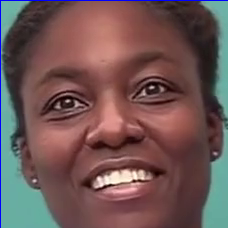

99


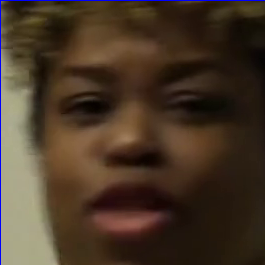

100


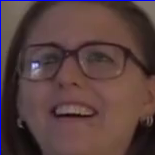

101


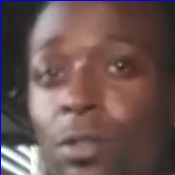

102


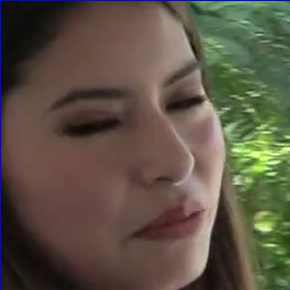

103


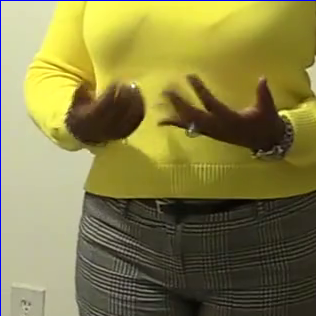

104


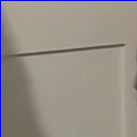

105
106


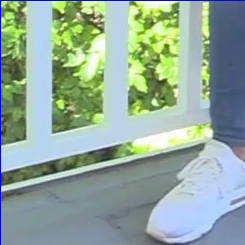

107


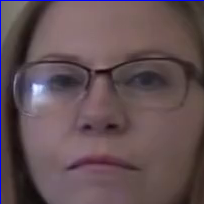

108


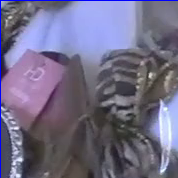

109


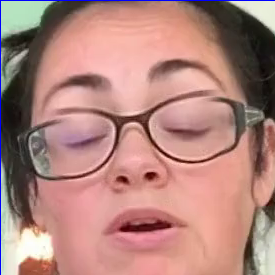

110


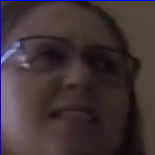

111
112


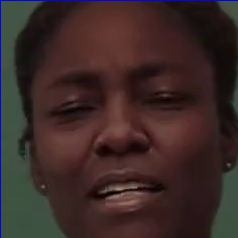

113
114


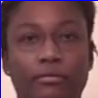

115


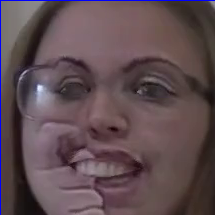

116


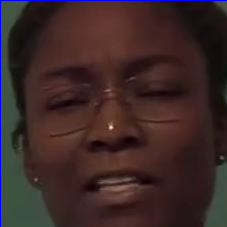

117


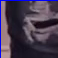

118


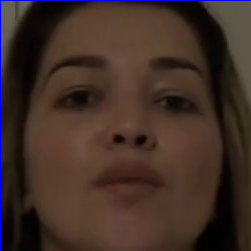

119


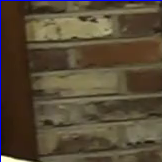

120


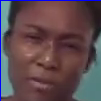

121


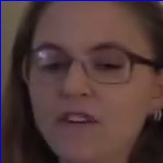

122
123


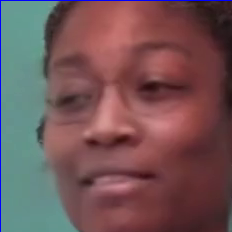

124


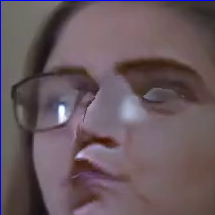

125


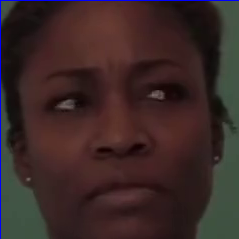

126


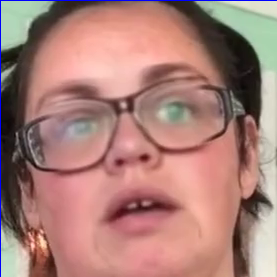

127


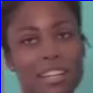

128
129


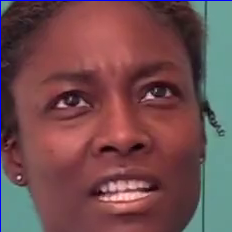

130


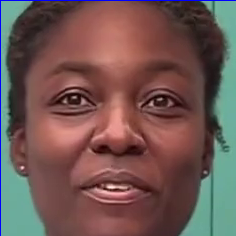

131


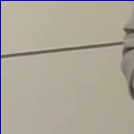

132


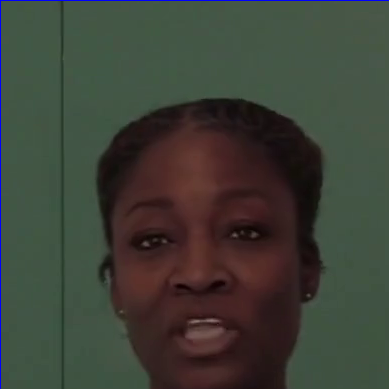

133


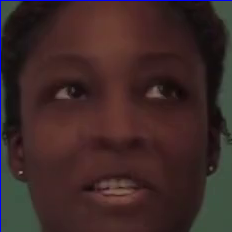

134


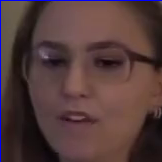

135


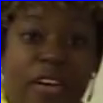

136


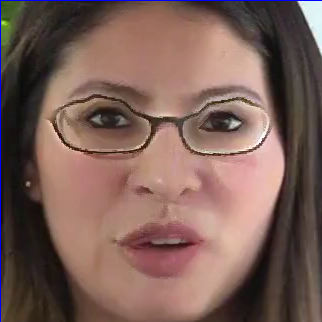

137


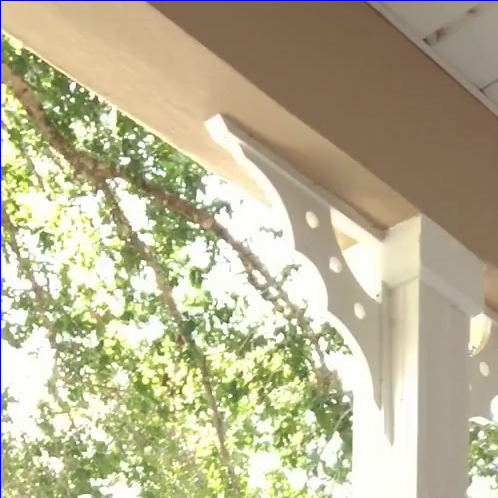

138


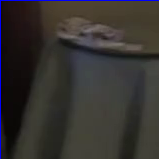

139


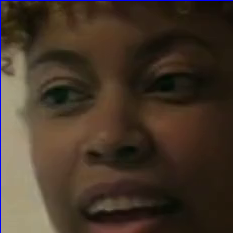

140


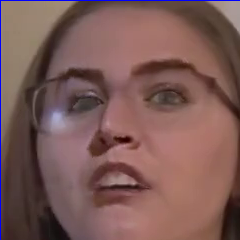

141
142


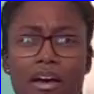

143


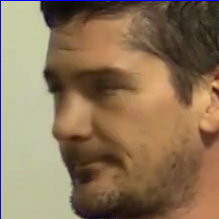

144


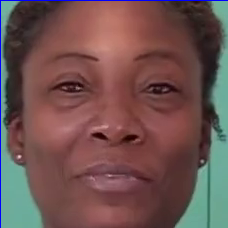

145


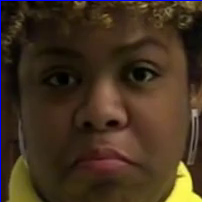

146


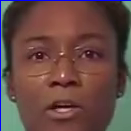

147


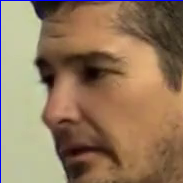

148


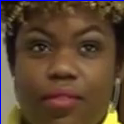

149


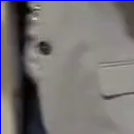

150


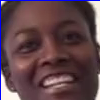

151


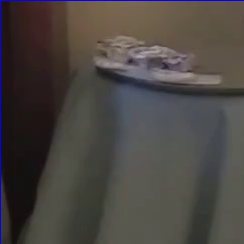

152


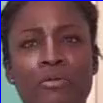

153


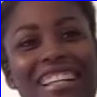

154


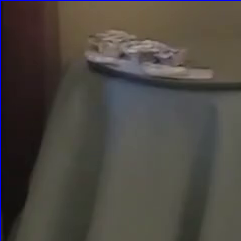

155


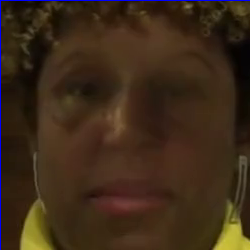

156


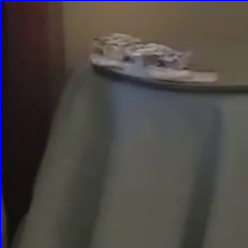

157


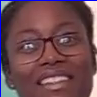

158


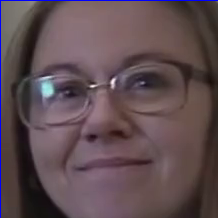

159


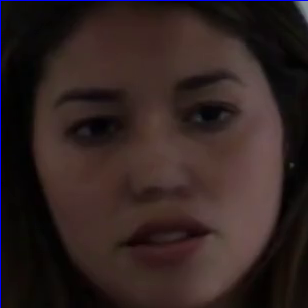

160


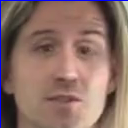

161


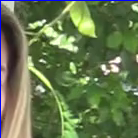

162


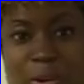

163


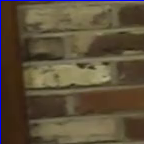

164


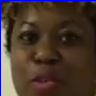

165
166


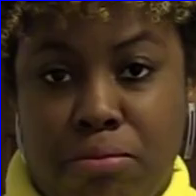

167


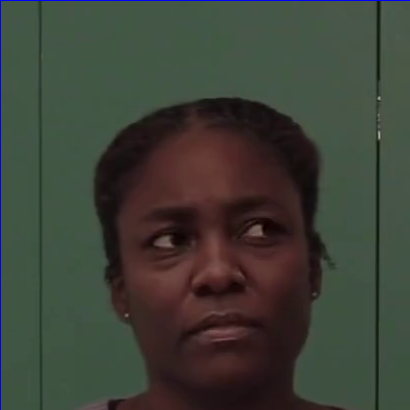

168


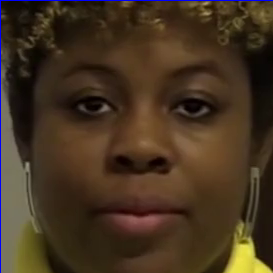

169


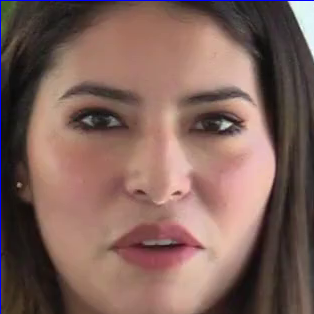

170


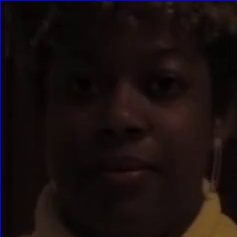

171


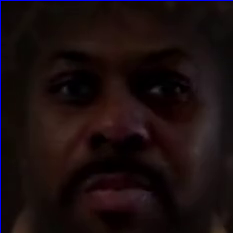

172


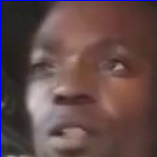

173


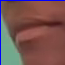

174


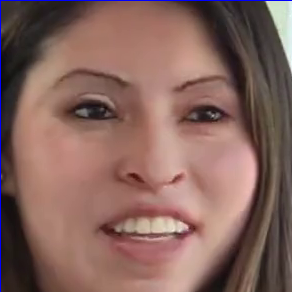

175


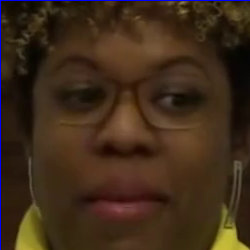

176


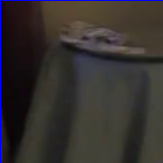

177


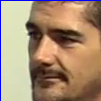

178


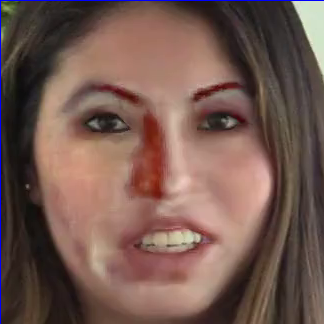

179


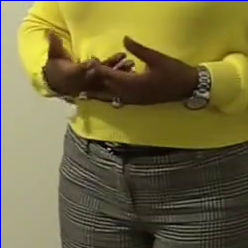

180


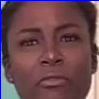

181


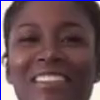

182


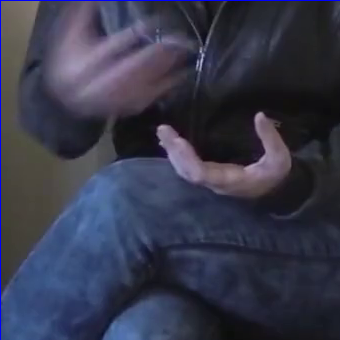

183


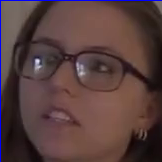

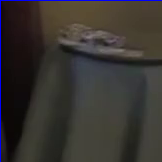

184


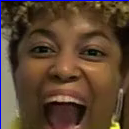

185


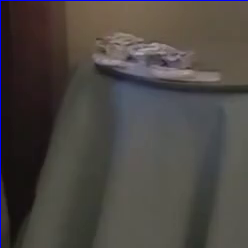

186


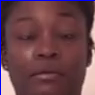

187


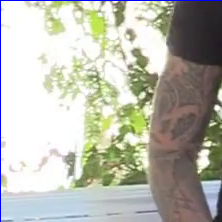

188


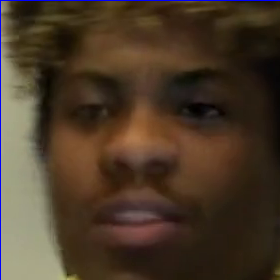

189
190


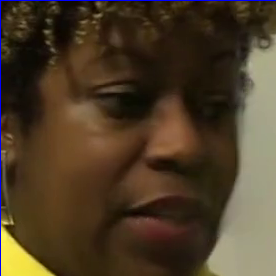

191


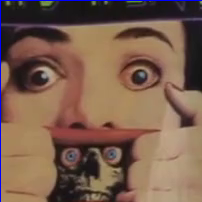

192


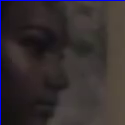

193


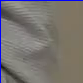

194
195


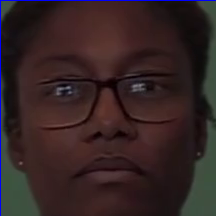

196


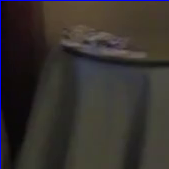

197


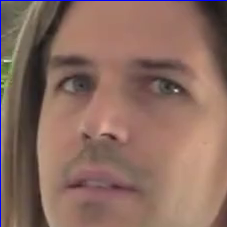

198


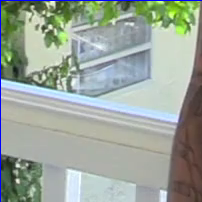

199


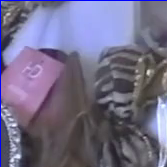

200
201


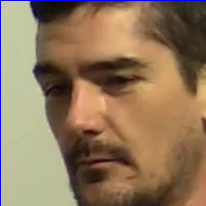

202


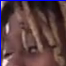

203


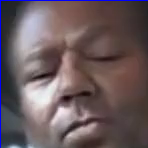

204


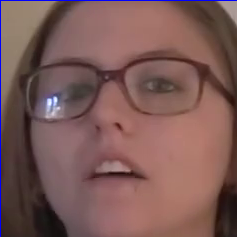

205


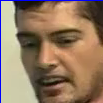

206


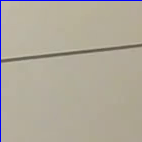

207


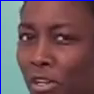

208


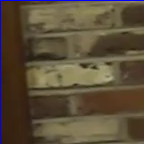

209


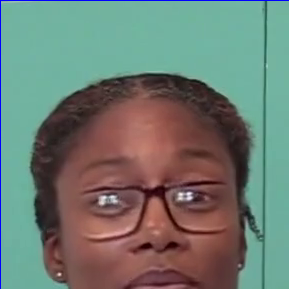

210


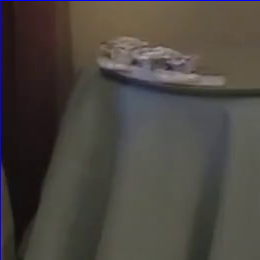

211


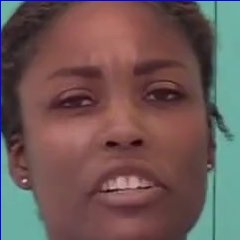

212


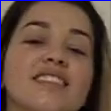

213


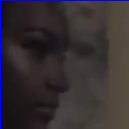

214


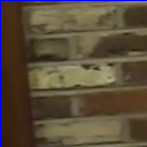

215


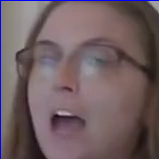

216


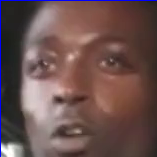

217


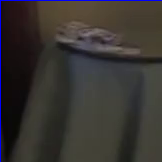

218


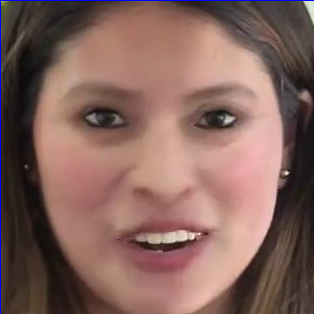

219


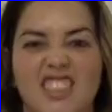

220


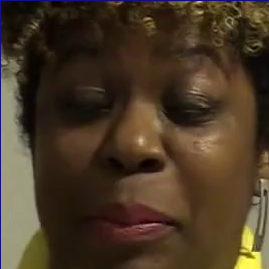

221


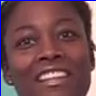

222


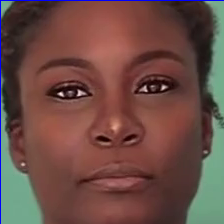

223


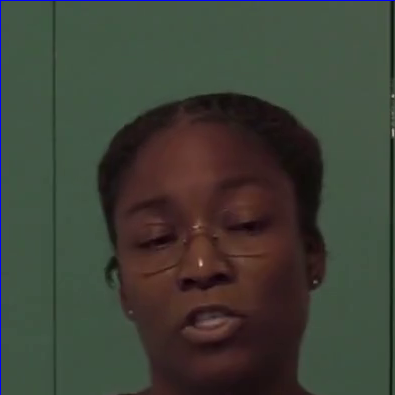

224


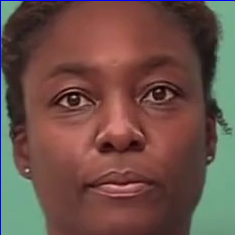

225


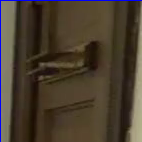

226


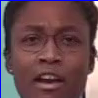

227


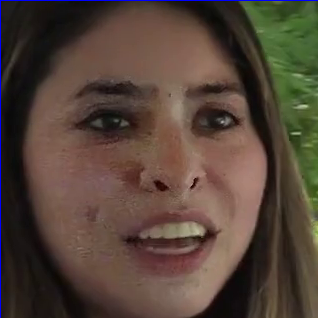

228


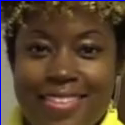

229


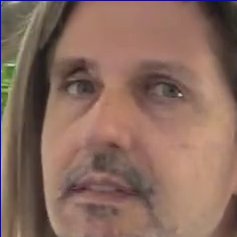

230


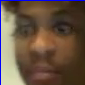

231


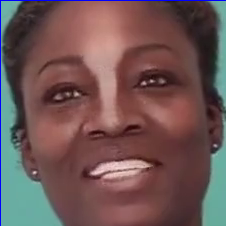

232


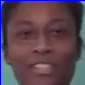

233
234


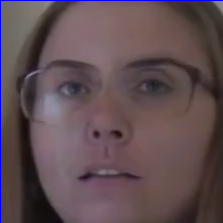

235


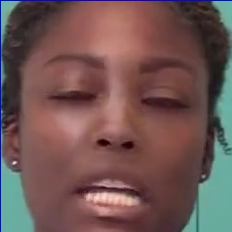

236


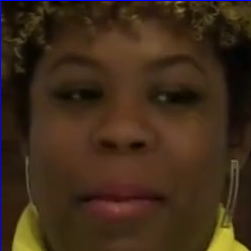

237


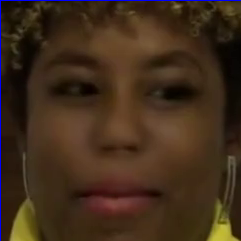

238


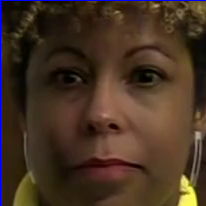

239


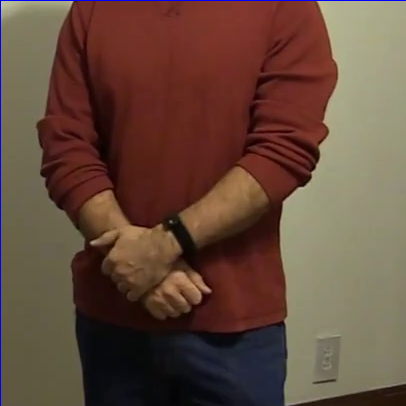

240


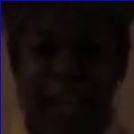

241


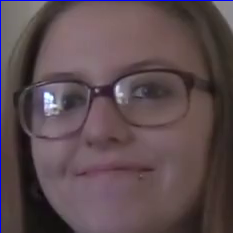

242


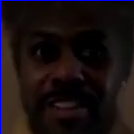

243
244


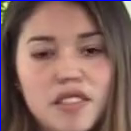

245
246


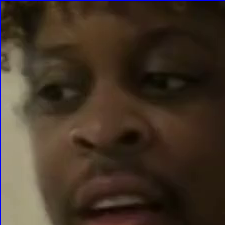

247


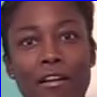

248


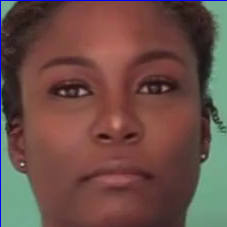

249


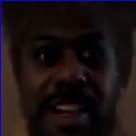

250


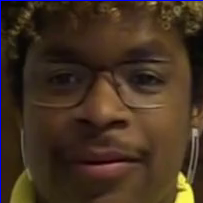

251


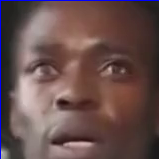

252


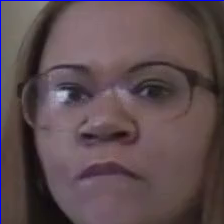

253


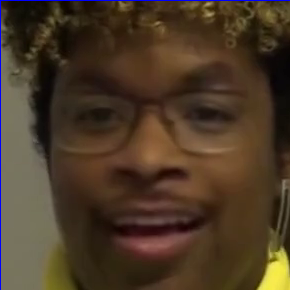

254


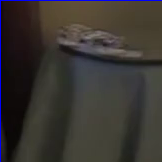

255


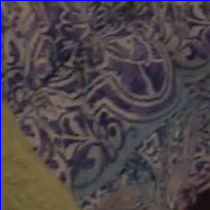

256


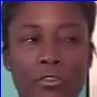

257


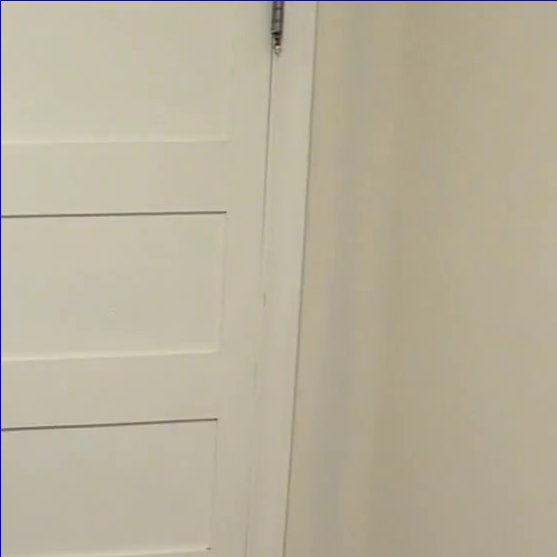

258


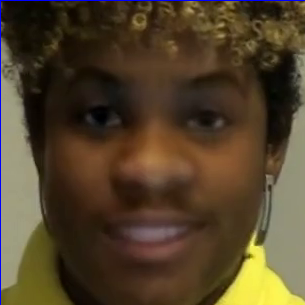

259


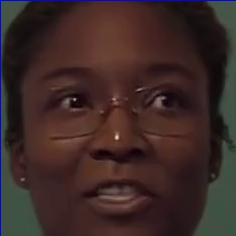

260


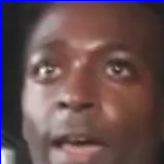

261


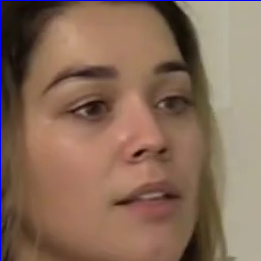

262
263


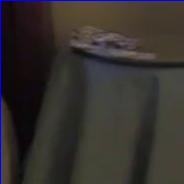

264


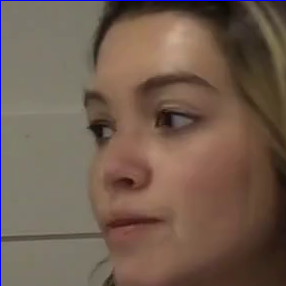

265


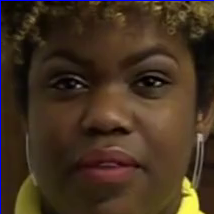

266


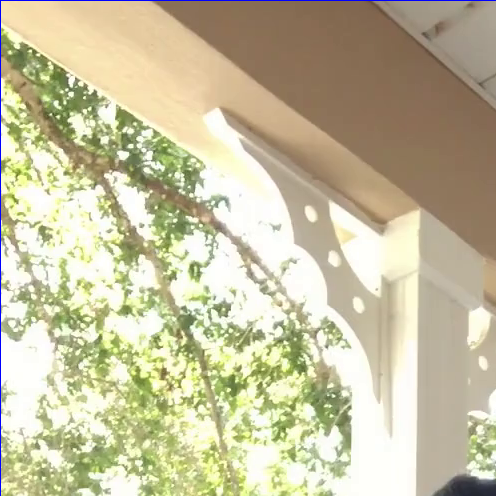

267


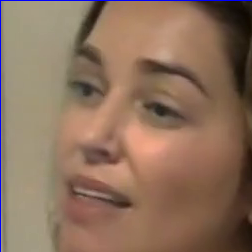

268


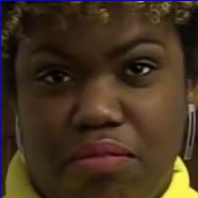

269


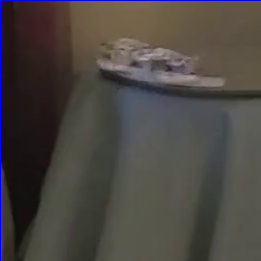

270


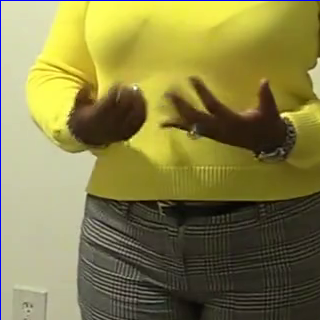

271


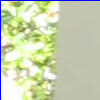

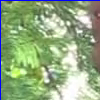

272


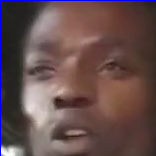

273


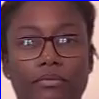

274


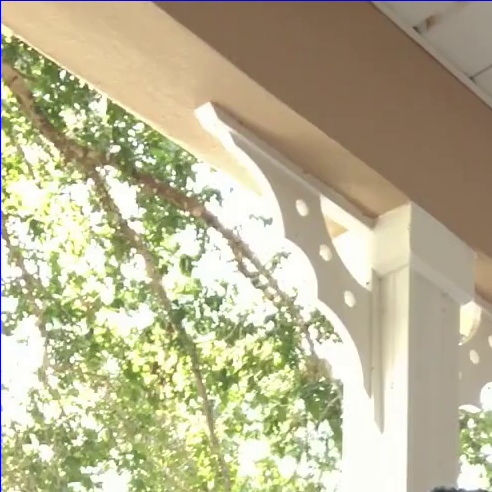

275
276


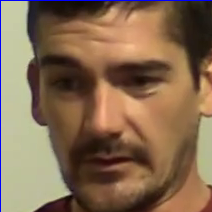

277


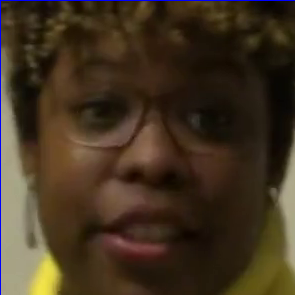

278


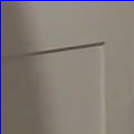

279


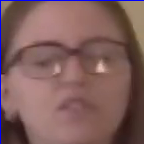

280


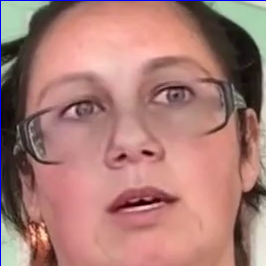

281


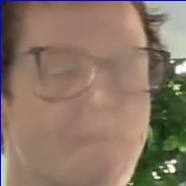

282
283


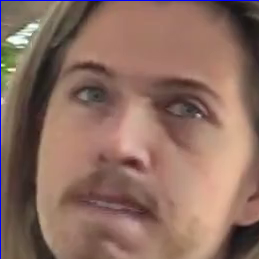

284
285


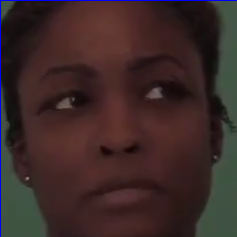

286


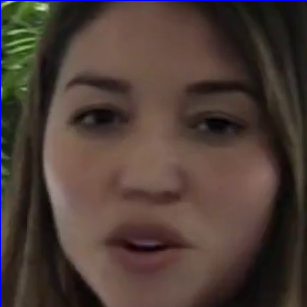

287


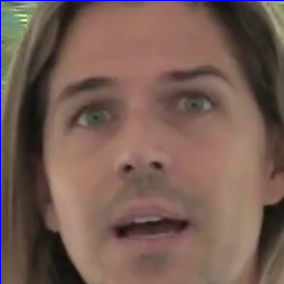

288


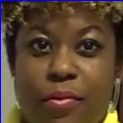

289


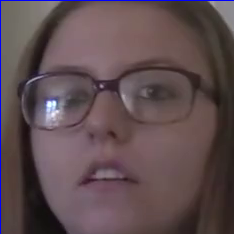

290


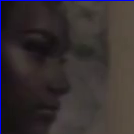

291


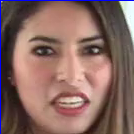

292


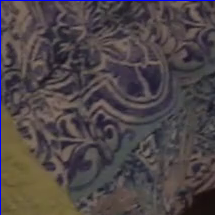

293


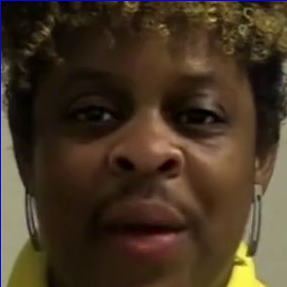

294


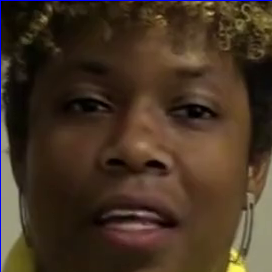

295


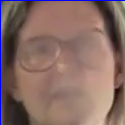

296


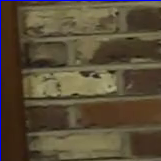

297


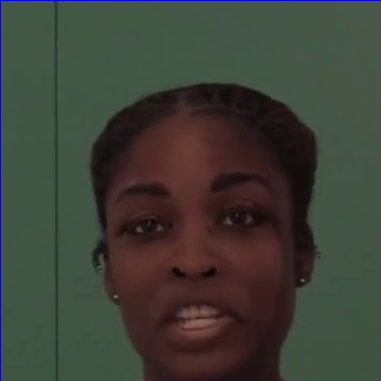

298


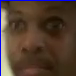

299


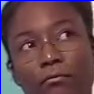

300


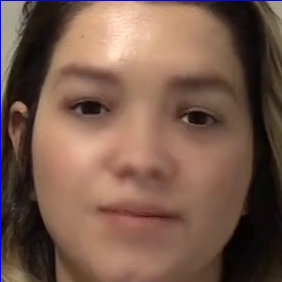

301


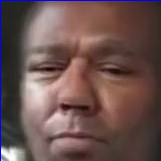

302


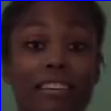

303


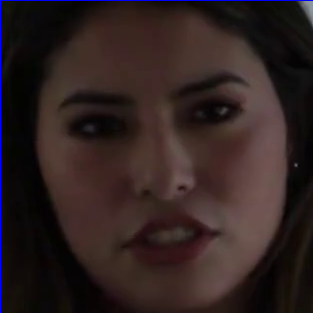

304


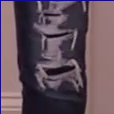

305
306


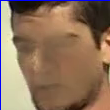

307


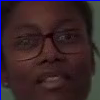

308


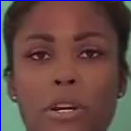

309


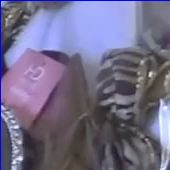

310
311


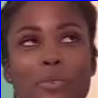

312
313


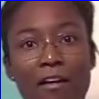

314


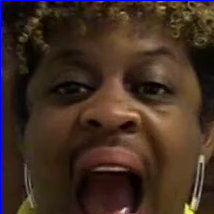

315


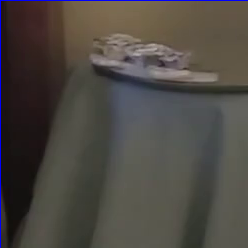

316
317


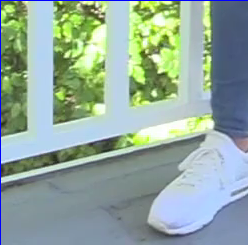

318


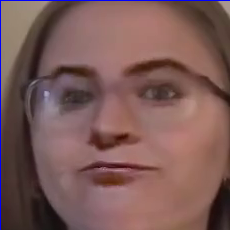

319


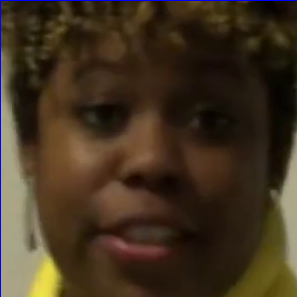

320


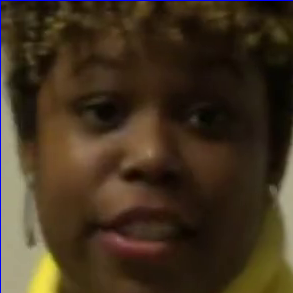

321


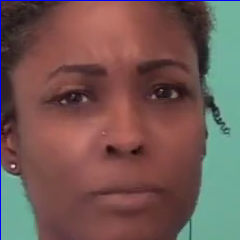

322


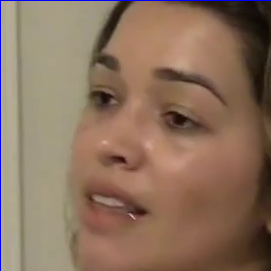

323


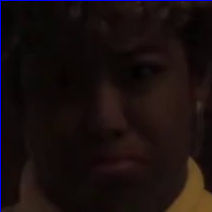

324


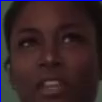

325


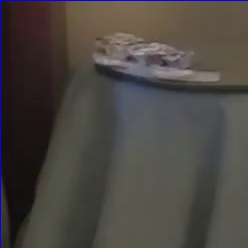

326


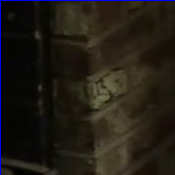

327


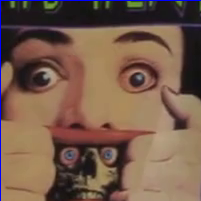

328
329
330


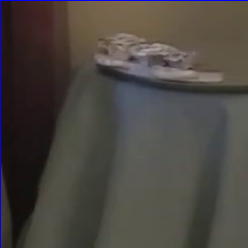

331


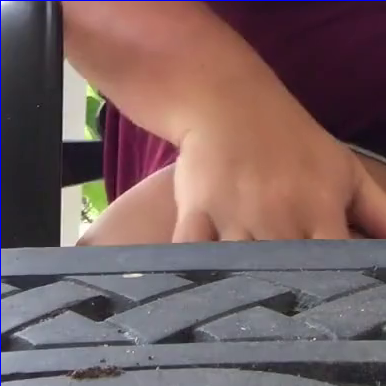

332


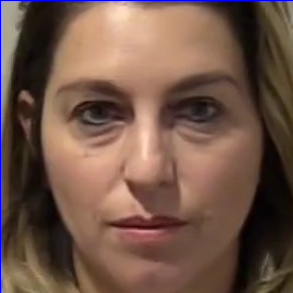

333


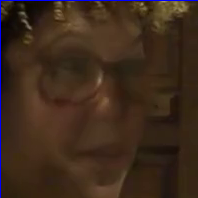

334


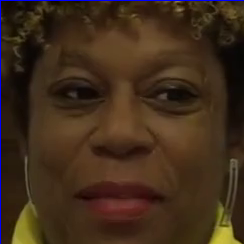

335


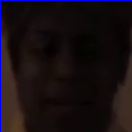

336


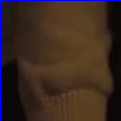

337


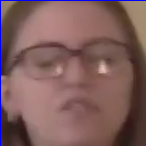

338


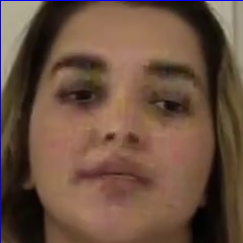

339


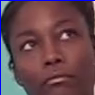

340


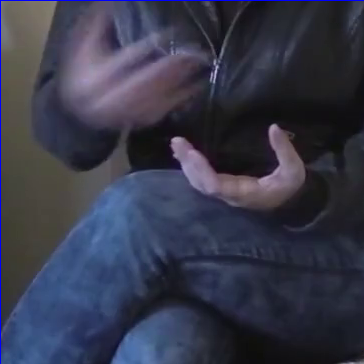

341


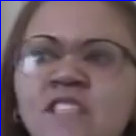

342


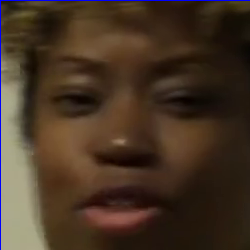

343


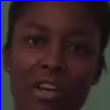

344


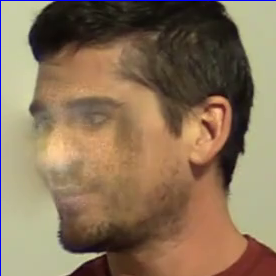

345


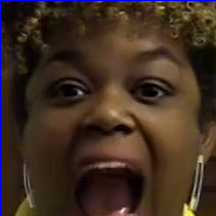

346


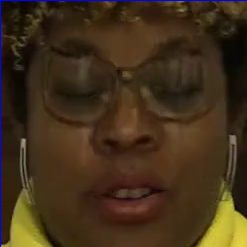

347


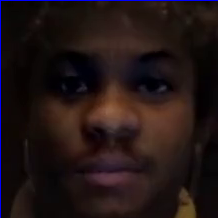

348


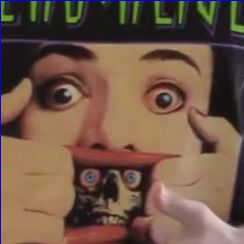

349


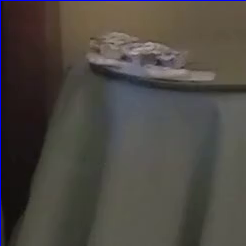

350


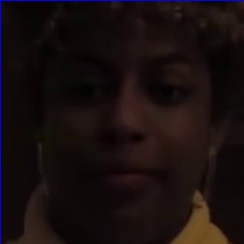

351


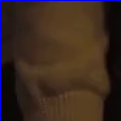

352


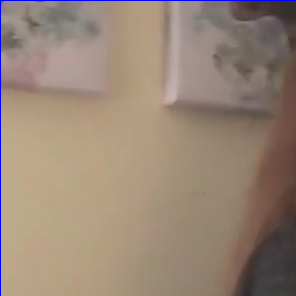

353


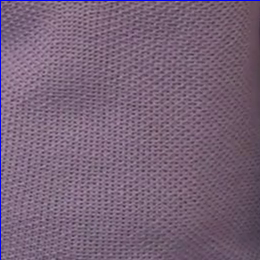

354


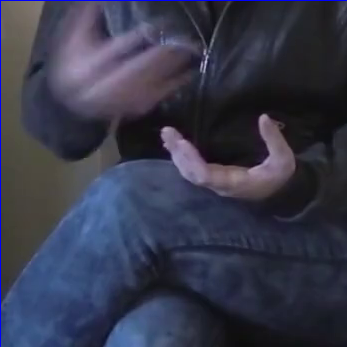

355


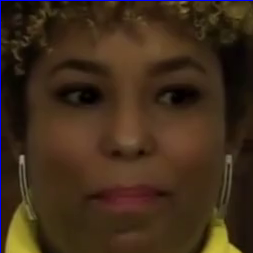

356


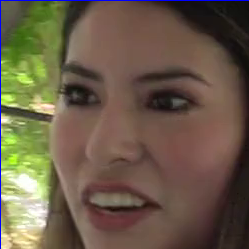

357


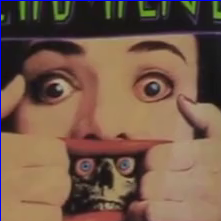

358


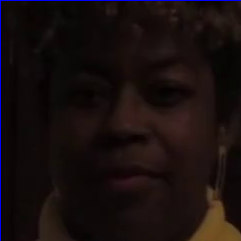

359


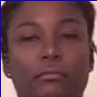

360


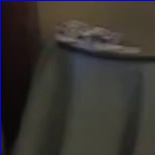

361


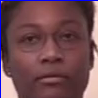

362


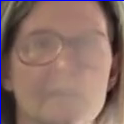

363


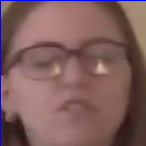

364


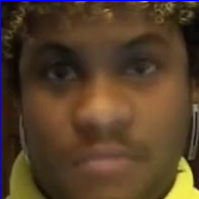

365


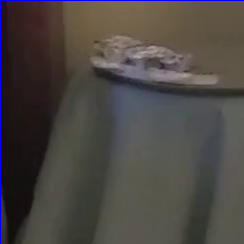

366


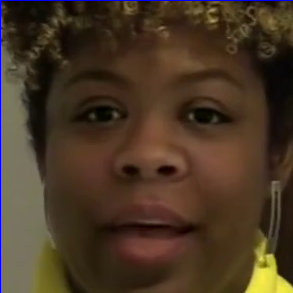

367


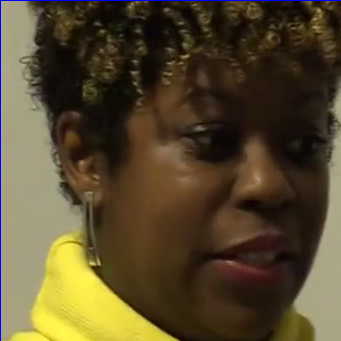

368
369


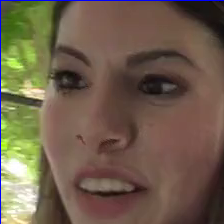

370
371


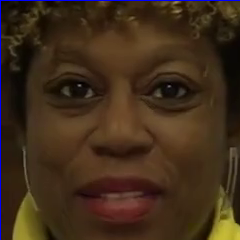

372


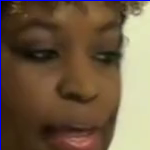

373


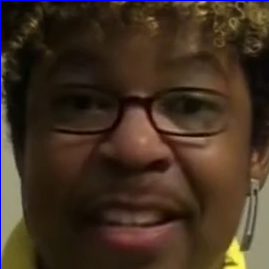

374


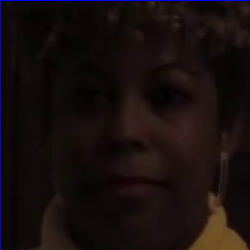

375
376


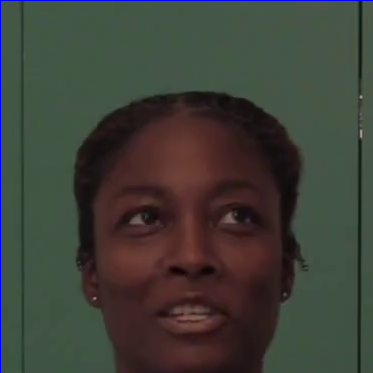

377


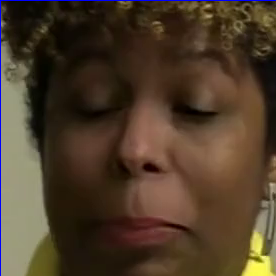

378


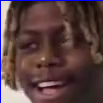

379
380


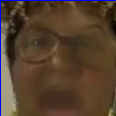

381


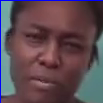

382


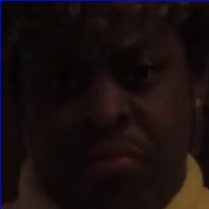

383


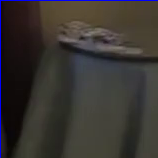

384


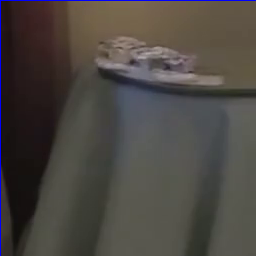

385


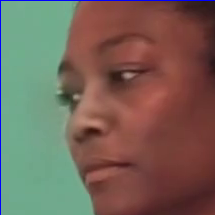

386


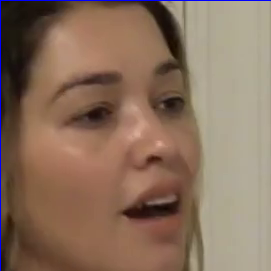

387


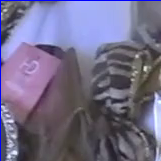

388


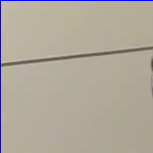

389


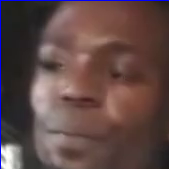

390
391


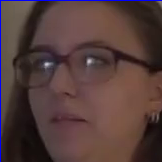

392


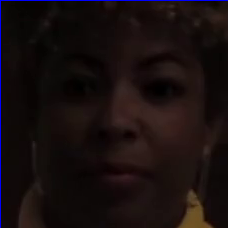

393


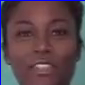

394


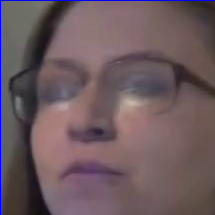

395


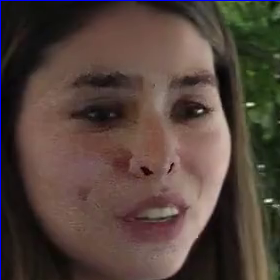

396


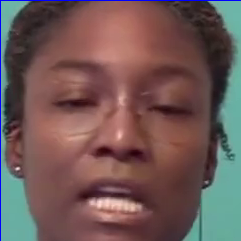

397


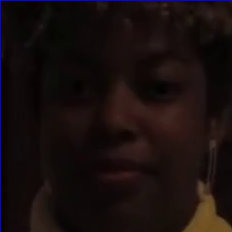

398


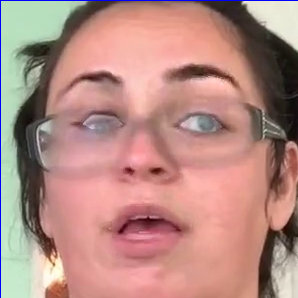

399


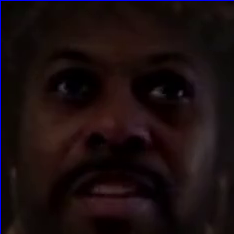

400


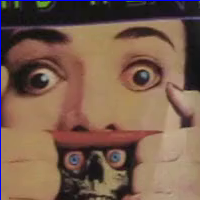

In [ ]:
from PIL import Image
import cv2  
import glob
import time
from google.colab.patches import cv2_imshow  
img_number=0
# Load the cascade  
face_cascade=cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")
#file path
path='/content/gdrive/MyDrive/Fake-Face-Detection-DeepFakes-CNN-master/videos/train_sample_videos/'  
all_videos=glob.glob(path + "*mp4")
li=[]
counter=0
for video in all_videos:
  # To capture video from existing video.  
  cap = cv2.VideoCapture(video)  
  counter=counter+1
  print(counter)
  #while True:  
    # Read the frame 
  _, img = cap.read()     
  _, img = cap.read()
  #cv2_imshow(img)  
    # Convert to grayscale  
    #gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  
 
    # Detect the faces  
  faces = face_cascade.detectMultiScale(img, scaleFactor=1.1, minNeighbors=2)  
  wmax=0
  hmax=0
  ImageFolder ='/content/gdrive/MyDrive/Fake-Face-Detection-DeepFakes-CNN-master/faces/train'
    # Draw the rectangle around each face  
  for (x, y, w, h) in faces: 
    if w>wmax and h>hmax:
      wmax=w
      hmax=h
  #print(wmax)
  #print(hmax)
  for (x, y, w, h) in faces: 
    img_number=img_number+1
    if w == wmax and h==hmax : 
        cv2.rectangle(img, (x, y), (x+w, y+h), (255, 0, 0), 1)  
        crop_img = img[y:y+h, x:x+w]
        li.append(crop_img)
        cv2.imwrite("/content/gdrive/MyDrive/Fake-Face-Detection-DeepFakes-CNN-master/faces/train/image_"+str(img_number)+".jpg",crop_img)
        #crop_img = crop_img.save("/content/gdrive/MyDrive/Fake-Face-Detection-DeepFakes-CNN-master/faces/trainimage_"+str(img_number)+".jpg")
        #test=cv2.imwrite('/content/gdrive/MyDrive/Fake-Face-Detection-DeepFakes-CNN-master/faces/train/image_{i}.png',crop_img)
        #print(test)
        
    # Display  
        cv2_imshow(crop_img) 
        #img.save('/content/gdrive/MyDrive/Fake-Face-Detection-DeepFakes-CNN-master/faces/train'+ crop_img , 'JPEG')
    # Stop if escape key is pressed  
  k = cv2.waitKey(1000) & 0xff  
  if k==27:  
        break  
         
# Release the VideoCapture object  
  cap.release()

## 3. Training Visualization 

In [ ]:
def performance_viz(history, xc_length):
    """
    Visualizes training history.
    
    Args
    ----------
    history : Keras object
        Holds the training history

    Returns
    -------
    Empty.
    """
    train_loss = history_aug.history['loss']
    val_loss = history_aug.history['val_loss']
    train_acc = history_aug.history['acc']
    val_acc = history_aug.history['val_acc']
    xc = range(xc_length)

    # Visualize Train vs Validation loss
    plt.figure(1,figsize=(7,5))
    plt.plot(xc,train_loss)
    plt.plot(xc,val_loss)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Train_loss vs Val_loss')
    plt.grid(True)
    plt.legend(['train','val'])
    print (plt.style.available)
    plt.style.use(['classic'])
    plt.show()
    # Visualize Train vs Validation Accuracy
    plt.figure(2,figsize=(7,5))
    plt.plot(xc,train_acc)
    plt.plot(xc,val_acc)
    plt.xlabel('Epochs')
    plt.ylabel('Acc')
    plt.title('Train Acc vs Val Acc')
    plt.grid(True)
    plt.legend(['Train','Val'],loc=4)
    plt.style.use(['classic'])
    plt.show()

## 4. Load Weights

In [ ]:
# Loads the weights and Evaluates the model's performance
def load_weights(model,file_name, test, test_targets):
    """
    Load the best weights saved from during training the proposed CNN architecture and evaluates the model's performance.
    
    Args
    ----------
    model : Keras object
        Holds the proposed CNN architecture.
    
    test : Numpy array
        Holds the test images.
    
    test_targets : Numpy Array
        Holds the images labels in a string format.
    
    Returns
    -------
    Empty.
    """
    model.load_weights('saved_models/' + file_name) # Load weights

    score = model.evaluate(test, test_targets, verbose=0)
    print('\n', 'Test accuracy:', score[1])

## 5. Data Exploration

In [ ]:
#plt.bar(range(2), [len(train_files_orig),len(train_files_fake)])

## 6. Image Sample

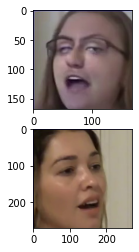

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load original image
img_1 = mpimg.imread(train_files[0])

# Load fake image
img_2 = mpimg.imread(train_files[2])

# Print a subplot
plt.figure(1)
plt.subplot(211)
plt.imshow(img_1)

plt.subplot(212)
plt.imshow(img_2)
plt.show()

## 7. Pre-process the Data

### Tensor Creation

In [ ]:
from keras.preprocessing import image                  
from tqdm import tqdm

def path_to_tensor(img_path):
    """
    Creates tensor of a single image to be consumed by the CNN architecture.
    
    Args
    ----------
    img_path : Numpy Array
        Holds the images paths.
    
    Returns
    -------
    Tensor : Tensorflow object.
        Holds the converted image.
    """
    # loads RGB image as PIL.Image.Image type
    img = image.load_img(img_path, target_size=(224, 224))
    # convert PIL.Image.Image type to 3D tensor with shape (224, 224, 3)
    x = image.img_to_array(img)
    # convert 3D tensor to 4D tensor with shape (1, 224, 224, 3) and return 4D tensor
    return np.expand_dims(x, axis=0)

def paths_to_tensor(img_paths):
    """
    Creates tensors of images to be consumed by the CNN architecture.
    
    Args
    ----------
    img_path : Numpy Array
        Holds the images paths.
    
    Returns
    -------
    list_of_tensors : Tensorflow object.
        Holds the converted images.
    """
    list_of_tensors = [path_to_tensor(img_path) for img_path in tqdm(img_paths)]
    return np.vstack(list_of_tensors)

### Resize, Rescale and Gray Scale Conversion

In [ ]:
def resize_img(img, max_dim=96):
    large_axis = max((0, 1), key=lambda x: img.size[x])
    scalar = max_dim / float(img.size[large_axis])
    resized = img.resize(
        (int(img.size[0] * scalar), int(img.size[1] * scalar)))
    return resized


def load_image_data(id_list, max_dim=96, center=True):   
    X = np.empty((len(id_list), max_dim, max_dim, 1))
    for i, idnum in enumerate(id_list):
        x = image.load_img(
            (str(idnum)), grayscale=True)
        x = image.img_to_array(resize_img(x, max_dim=max_dim))
        height = x.shape[0]
        width = x.shape[1]
        if center:
            h1 = int((max_dim - height) / 2)
            h2 = h1 + height
            w1 = int((max_dim - width) / 2)
            w2 = w1 + width
        else:
            h1, w1 = 0, 0
            h2, w2 = (height, width)
        X[i, h1:h2, w1:w2, :] = x
    return np.around(X / 255.0)

### Image Augmentation For The Fake Photos

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
def aug():
    """
    Auguments the images in case the dataset of images is small.
    
    Args
    ----------
    Empty.
    
    Returns
    -------
    datagen_train : ImageDatagenerator Object.
        Holds the augumented train dataset.
    """
    # create and configure augmented image generator
    datagen_train = ImageDataGenerator(
        width_shift_range=0.2,  # randomly shift images horizontally (10% of total width)
        height_shift_range=0.2,  # randomly shift images vertically (10% of total height)
        #horizontal_flip=True,
        #vertical_flip = True,
        shear_range=0.15,
        zoom_range=0.2) # randomly flip images horizontally
        # fit augmented image generator on data
    return datagen_train
    #datagen_valid.fit(valid_tensors)


## 8. Custom Architecture

In [ ]:
# !pip uninstall tensorflow
# !pip install tensorflow==1.4.0
!pip install tensorflow

# !pip uninstall keras
# !pip install keras==2.0.8
from tensorflow import keras
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D
from tensorflow.keras.layers import Dropout, Flatten, Dense
from tensorflow.keras import Sequential
from tensorflow import keras
# from tensorflow.keras import layers
# !pip install tensorflow.keras.layers.normalization
!pip install keras-layer-normalization
from tensorflow.keras.layers import BatchNormalization
from keras_layer_normalization import LayerNormalization
# from keras.layers.normalization import BatchNormalization

# from LayerNormalization import BatchNormalization
"""
    Propsoed CNN architecture.

"""

model = Sequential()

# Pamameters Initialization
input_shape = (96, 96, 1)
activation = 'relu'
padding = 'same'
droprate = 0.1
epsilon=0.001

model = Sequential()
model.add(BatchNormalization(input_shape=input_shape))
model.add(Conv2D(filters=16, kernel_size=3, activation=activation, padding=padding))
model.add(MaxPooling2D(pool_size=2))
model.add(BatchNormalization(epsilon=epsilon))


model.add(Conv2D(filters=32, kernel_size=3, activation=activation, padding=padding))
model.add(MaxPooling2D(pool_size=2))
model.add(BatchNormalization(epsilon=epsilon))
model.add(Dropout(droprate))

model.add(Conv2D(filters=64, kernel_size=3, activation=activation, padding=padding))
model.add(MaxPooling2D(pool_size=2))
model.add(BatchNormalization(epsilon=epsilon))
model.add(Dropout(droprate))

model.add(Conv2D(filters=128, kernel_size=3, activation=activation, padding=padding))
model.add(MaxPooling2D(pool_size=2))
model.add(BatchNormalization(epsilon=epsilon))
model.add(Dropout(droprate))

model.add(Conv2D(filters=256, kernel_size=3, activation=activation, padding=padding))
model.add(MaxPooling2D(pool_size=2))
model.add(BatchNormalization(epsilon=epsilon))
model.add(Dropout(droprate))

model.add(Conv2D(filters=512, kernel_size=3, activation=activation, padding=padding))
model.add(MaxPooling2D(pool_size=2))
model.add(BatchNormalization(epsilon=epsilon))
model.add(Dropout(droprate))

model.add(GlobalAveragePooling2D())
#model.add(Flatten())
#model.add(Dense(256, kernel_initializer='glorot_normal', activation='relu'))
#model.add(Dropout(0.5))

#model.add(Dense(128, kernel_initializer='glorot_normal', activation='relu'))
#model.add(Dropout(0.5))
#model.add(Dropout(droprate))
model.add(Dense(2, activation='softmax'))

model.summary() # Summary of the architecture

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for keras-layer-normalization: filename=keras_layer_normalization-0.16.0-py3-none-any.whl size=4668 sha256=48364996e7937ac1c24b5dd05f7fc99bd58ebcd6a34f675fe1bf3d9868f335ac
  Stored in directory: /root/.cache/pip/wheels/d7/2b/f4/28f4bab995fa99c26b761bc7f9aeb5bf6c81e9be6ccd0b853b
Successfully built keras-layer-normalization
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization (BatchN  (None, 96, 96, 1)        4         
 ormalization)                                                   
                                                                 
 conv2d (Conv2D)             (None, 96, 96, 16)        160       
                                            

## Model Compile

In [ ]:
# Parameters Initialization
from tensorflow.keras.optimizers import RMSprop
# from tensorflow.python.keras.optimizers import rmsprop,SGD,Adam,Adadelta

#opt = rmsprop(lr=0.0001, decay=1e-6)

model.compile(loss='categorical_crossentropy',optimizer=RMSprop(0.0001), metrics=['accuracy'])

## Load Data

In [ ]:
import keras.utils as image
train_X = load_image_data(train_files)
valid_X = load_image_data(valid_files)
test_X = load_image_data(test_files)

train_augmented_X = aug()

/usr/local/lib/python3.8/dist-packages/keras/utils/image_utils.py:382: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn('grayscale is deprecated. Please use '


## Train Model

### Train Model on Original Data

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping 

batch_size = 10
epochs = 100

checkpointer = ModelCheckpoint(filepath='/content/gdrive/My Drive/saved_models/weights.custom.best.hdf5',
                               monitor='val_loss',verbose=1, save_best_only=True)

early_stopping = EarlyStopping(monitor='val_loss', patience=4, verbose=0, mode='auto')
hist = model.fit(train_X, train_targets,
                    steps_per_epoch=train_X.shape[0] ,
                    epochs=epochs, verbose=1, callbacks=[checkpointer,early_stopping],
                    validation_data=(valid_X, valid_targets),
                    validation_steps=valid_X.shape[0] )




Epoch 1/100
190/191 [============================>.] - ETA: 0s - loss: 0.6408 - accuracy: 0.7684
Epoch 1: val_loss improved from inf to 0.66999, saving model to /content/gdrive/My Drive/saved_models/weights.custom.best.hdf5
191/191 [==============================] - 17s 67ms/step - loss: 0.6401 - accuracy: 0.7696 - val_loss: 0.6700 - val_accuracy: 0.6575
Epoch 2/100
191/191 [==============================] - ETA: 0s - loss: 0.5639 - accuracy: 0.7853
Epoch 2: val_loss did not improve from 0.66999
191/191 [==============================] - 11s 58ms/step - loss: 0.5639 - accuracy: 0.7853 - val_loss: 1.6242 - val_accuracy: 0.5414
Epoch 3/100
191/191 [==============================] - ETA: 0s - loss: 0.5324 - accuracy: 0.7853
Epoch 3: val_loss did not improve from 0.66999
191/191 [==============================] - 9s 47ms/step - loss: 0.5324 - accuracy: 0.7853 - val_loss: 7.9181 - val_accuracy: 0.3425
Epoch 4/100
191/191 [==============================] - ETA: 0s - loss: 0.5243 - accuracy: 

### Evaluate Model on Orgiginal Data

In [ ]:
model_custom = keras.models.load_model('/content/gdrive/MyDrive/saved_models/weights.custom.best.hdf5')
model_custom.load_weights('/content/gdrive/MyDrive/saved_models/weights.custom.best.hdf5')


### Train Model on Augumented Data

In [ ]:
batch_size = 20
epochs = 25

from keras.callbacks import ModelCheckpoint,EarlyStopping  
early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=0, mode='auto')
checkpointer = ModelCheckpoint(filepath='saved_models/weights.aug.best.hdf5', 
                               monitor='val_loss',verbose=1, save_best_only=True)
history_aug = model_custom.fit_generator(train_augmented_X.flow(train_X, train_targets, batch_size=batch_size,shuffle=True),
                    steps_per_epoch=train_X.shape[0] ,
                    epochs=epochs, verbose=1, callbacks=[checkpointer,early_stopping],
                    validation_data=(valid_X, valid_targets),
                    validation_steps=valid_X.shape[0] )

Epoch 1/25


<ipython-input-17-e037eeb7ff37>:8: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history_aug = model_custom.fit_generator(train_augmented_X.flow(train_X, train_targets, batch_size=batch_size,shuffle=True),


 10/191 [>.............................] - ETA: 1:11 - loss: 1.2565 - accuracy: 0.6021


Epoch 1: val_loss improved from inf to 2.31670, saving model to saved_models/weights.aug.best.hdf5
191/191 [==============================] - 7s 29ms/step - loss: 1.2565 - accuracy: 0.6021 - val_loss: 2.3167 - val_accuracy: 0.1878


### Model Evaluation on Augumented Data

In [ ]:
load_weights(model_custom,'weights.aug.best.hdf5', test_X, test_targets)


 Test accuracy: 0.18784530460834503


## ResNet50V2 Implementation

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
import os
import numpy as np
import pandas as pd
import seaborn as sn
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB7, ResNet50V2, VGG19
from tensorflow.keras.applications import Xception, InceptionResNetV2
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten
from tensorflow.keras.layers import Dense, Dropout, InputLayer
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras import optimizers
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from scipy.interpolate import make_interp_spline, BSpline

Mounted at /content/gdrive


# Initializing the Common Variables

In [ ]:
input_shape = (128, 128, 3)
batch_size = 64
epochs = 50
epoch_list = list(range(1, epochs+1))

# Path to training & testing set.

In [ ]:
train_dir = '/content/gdrive/MyDrive/DATASET/facesResNet/train'
test_dir = '/content/gdrive/MyDrive/DATASET/facesResNet/test'

train_dir_fake, test_dir_fake = os.path.join(train_dir, 'fake'), os.path.join(test_dir, 'fake')
train_dir_real, test_dir_real = os.path.join(train_dir, 'real'), os.path.join(test_dir, 'real')

train_fake_fnames, test_fake_fnames = os.listdir(train_dir_fake), os.listdir(test_dir_fake)
train_real_fnames, test_real_fnames = os.listdir(train_dir_real), os.listdir(test_dir_real)

# Training Data Generator.
train_datagen = ImageDataGenerator(rescale=1./255.)

# Testing Data Generator.
test_datagen = ImageDataGenerator(rescale=1./255.)

In [ ]:
# Flow training images in batches of 64 using train_datagen generator
train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=(128, 128),
                                                    batch_size=batch_size,
                                                    class_mode='binary')

# Flow test images in batches of 64 using test_datagen generator
test_generator = test_datagen.flow_from_directory(test_dir,
                                                    target_size=(128, 128),
                                                    batch_size=batch_size,
                                                    class_mode='binary')

Found 191 images belonging to 2 classes.
Found 181 images belonging to 2 classes.


In [ ]:
# Loading the Neural Network & Pre-Trained Weights.
ResNet50V2_model = ResNet50V2(input_shape=input_shape, include_top=False, weights="imagenet", classes=2)

for i in range(50):
    l = ResNet50V2_model.get_layer(index=i)
    l.trainable = True

# Extending the Neural Network Sequentially.
model = Sequential()
model.add(ResNet50V2_model)
model.add(GlobalAveragePooling2D())
model.add(Dense(units=1, activation='sigmoid'))

94668760/94668760 [==============================] - 3s 0us/step


# Compiling the Model


In [ ]:
# Compiling the Model.
model.compile(loss='binary_crossentropy',
                optimizer=optimizers.Adam(lr=1e-6, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0),
                metrics=['accuracy'])


# Early Stopping mechanism to stop training if the loss rate is unchanged for certain epochs.
reduce = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, mode='auto')
early_stopping = EarlyStopping(monitor='val_loss', min_delta=1e-4, patience=5, verbose=0, mode='auto')

# Starting the Training.
history = model.fit(train_generator, epochs=epochs, validation_data=test_generator)



/usr/local/lib/python3.8/dist-packages/keras/optimizers/optimizer_v2/adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/50
3/3 [==============================] - 138s 55s/step - loss: 0.8628 - accuracy: 0.4031 - val_loss: 2.0391 - val_accuracy: 0.2376
Epoch 2/50
3/3 [==============================] - 56s 20s/step - loss: 0.8432 - accuracy: 0.4764 - val_loss: 1.9835 - val_accuracy: 0.2376
Epoch 3/50
3/3 [==============================] - 52s 19s/step - loss: 0.8055 - accuracy: 0.4921 - val_loss: 1.9326 - val_accuracy: 0.2376
Epoch 4/50
3/3 [==============================] - 54s 20s/step - loss: 0.8020 - accuracy: 0.4503 - val_loss: 1.8823 - val_accuracy: 0.2486
Epoch 5/50
3/3 [==============================] - 53s 19s/step - loss: 0.7753 - accuracy: 0.4712 - val_loss: 1.8326 - val_accuracy: 0.2486
Epoch 6/50
3/3 [==============================] - 53s 19s/step - loss: 0.7530 - accuracy: 0.5236 - val_loss: 1.7828 - val_accuracy: 0.2486
Epoch 7/50
3/3 [==============================] - 57s 21s/step - loss: 0.7337 - accuracy: 0.5340 - val_loss: 1.7317 - val_accuracy: 0.2376
Epoch 8/50
3/3 [==========

In [ ]:
# Plotting the graphs
network_name = "ResNet50V2"

try:
    os.mkdir("./Reference_Data")
    os.mkdir("./Reference_Data/Graphs")
    os.mkdir("./Reference_Data/Summary")
    os.mkdir("./Reference_Data/Model")
except OSError:
    pass

try:
    os.mkdir(os.path.join("./Reference_Data/Graphs", network_name))
except OSError:
    pass

#define x as 200 equally spaced values between the min and max of original x 
acc = np.linspace(min(epoch_list), max(epoch_list), 200) 
val_acc = np.linspace(min(epoch_list), max(epoch_list), 200) 

#define spline for accuracy
spl1 = make_interp_spline(epoch_list, history.history['accuracy'], k=3)
y_smooth1 = spl1(acc)
#define spline accuracy
spl2 = make_interp_spline(epoch_list, history.history['val_accuracy'], k=3)
y_smooth2 = spl2(val_acc)

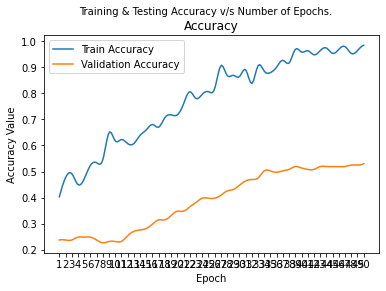

In [ ]:
#create smooth line chart 
graph_1 = plt.subplots(1, 1)
plt.suptitle('Training & Testing Accuracy v/s Number of Epochs.', fontsize=10)
plt.plot(acc, y_smooth1, label='Train Accuracy')
plt.plot(val_acc, y_smooth2, label='Validation Accuracy')
plt.xticks(np.arange(1, epochs + 1, 1))
plt.ylabel('Accuracy Value')
plt.xlabel('Epoch')
plt.title('Accuracy')
plt.legend(loc="best")
plt.savefig(os.path.join("./Reference_Data/Graphs", network_name, "AccuracyVEpochs.png"), dpi=300,
            bbox_inches='tight')

#define x as 200 equally spaced values between the min and max of original x 
loss = np.linspace(min(epoch_list), max(epoch_list), 200) 
val_loss = np.linspace(min(epoch_list), max(epoch_list), 200) 

#define spline for accuracy
spl3 = make_interp_spline(epoch_list, history.history['loss'], k=3)
y_smooth3 = spl3(loss)
#define spline accuracy
spl4 = make_interp_spline(epoch_list, history.history['val_loss'], k=3)
y_smooth4 = spl4(val_loss)


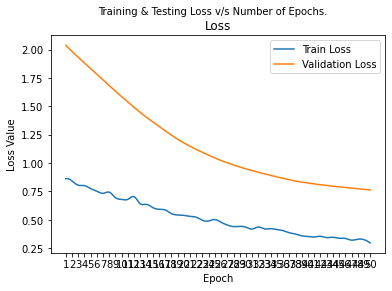

In [ ]:
#create smooth line chart 
graph_2 = plt.subplots(1, 1)
plt.suptitle('Training & Testing Loss v/s Number of Epochs.', fontsize=10)
plt.plot(loss, y_smooth3, label='Train Loss')
plt.plot(val_loss, y_smooth4, label='Validation Loss')
plt.xticks(np.arange(1, epochs + 1, 1))
plt.ylabel('Loss Value')
plt.xlabel('Epoch')
plt.title('Loss')
plt.legend(loc="best")
plt.savefig(os.path.join("./Reference_Data/Graphs", network_name, "LossVEpochs.png"), dpi=300, 
            bbox_inches='tight')
plt.show()


# Saving model summary
with open("./Reference_Data/Summary/" + network_name + "summary.txt", 'w+') as f:
    model.summary(print_fn=lambda x: f.write(x + '\n'))

# Saving the Model for Inference Purpose.
model.save('./Reference_Data/Model/' + network_name + '/')
model.save('./Reference_Data/Model/' + network_name + '/' + network_name + '.h5')

## VGG-19 Implementation

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
import os
import numpy as np
import pandas as pd
import seaborn as sn
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras.applications import EfficientNetB7, ResNet101V2, VGG19
from tensorflow.keras.applications import Xception, InceptionResNetV2
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, BatchNormalization
from tensorflow.keras.layers import Dense, Dropout, InputLayer, LeakyReLU
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras import optimizers
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from scipy.interpolate import make_interp_spline, BSpline

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
# Initializing the Common Variables.

input_shape=(128, 128, 3)
batch_size = 32
epochs = 50
epoch_list = list(range(1, epochs+1))

In [ ]:
# Path to training & testing set.
train_dir = '/content/gdrive/MyDrive/DATASET/facesResNet/train'
test_dir = '/content/gdrive/MyDrive/DATASET/facesResNet/test'

train_dir_fake, test_dir_fake = os.path.join(train_dir, 'fake'), os.path.join(test_dir, 'fake')
train_dir_real, test_dir_real = os.path.join(train_dir, 'real'), os.path.join(test_dir, 'real')

train_fake_fnames, test_fake_fnames = os.listdir(train_dir_fake), os.listdir(test_dir_fake)
train_real_fnames, test_real_fnames = os.listdir(train_dir_real), os.listdir(test_dir_real)

In [ ]:
# Training Data Generator.
train_datagen = ImageDataGenerator(rescale=1./255.)

# Testing Data Generator.
test_datagen = ImageDataGenerator(rescale=1./255.)

# Flow training images in batches of 64 using train_datagen generator
train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=(128, 128),
                                                    batch_size=batch_size,
                                                    class_mode='binary')


Found 191 images belonging to 2 classes.


In [ ]:
# Flow test images in batches of 64 using test_datagen generator
test_generator = test_datagen.flow_from_directory(test_dir,
                                                  target_size=(128, 128),
                                                  batch_size=batch_size,
                                                  class_mode='binary')


base_model = VGG19(input_shape = (128, 128, 3), include_top = False, weights = 'imagenet')

for layer in base_model.layers:
    layer.trainable = True

Found 181 images belonging to 2 classes.
80134624/80134624 [==============================] - 3s 0us/step


In [ ]:
# Flatten the output layer to 1 dimension
x = Flatten()(base_model.output)

# Add a fully connected layer with 512 hidden units and ReLU activation
x = Dense(512, activation='relu')(x)

# Add a dropout rate of 0.5
x = Dropout(0.5)(x)

# Add a final sigmoid layer for classification
x = Dense(1, activation='sigmoid')(x)

model = tf.keras.models.Model(base_model.input, x)

model.compile(optimizer = tf.keras.optimizers.Adam(lr=1e-5), loss = 'binary_crossentropy', metrics = ['accuracy'])



/usr/local/lib/python3.8/dist-packages/keras/optimizers/optimizer_v2/adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [ ]:
# Early Stopping mechanism to stop training if the loss rate is unchanged for certain epochs.
reduce = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, mode='auto')
early_stopping = EarlyStopping(monitor='val_loss', min_delta=1e-4, patience=5, verbose=0, mode='auto')

history = model.fit(train_generator,
                    epochs=epochs,
                    validation_data=test_generator)


network_name = "VGG-19"

try:
    os.mkdir("./Reference_Data")
    os.mkdir("./Reference_Data/Graphs")
    os.mkdir("./Reference_Data/Summary")
    os.mkdir("./Reference_Data/Model")
except OSError:
    pass

try:
    os.mkdir(os.path.join("./Reference_Data/Graphs", network_name))
except OSError:
    pass


Epoch 1/50
6/6 [==============================] - 205s 35s/step - loss: 0.6622 - accuracy: 0.6335 - val_loss: 0.5006 - val_accuracy: 0.8011
Epoch 2/50
6/6 [==============================] - 202s 35s/step - loss: 0.5572 - accuracy: 0.7958 - val_loss: 0.5119 - val_accuracy: 0.8011
Epoch 3/50
6/6 [==============================] - 200s 35s/step - loss: 0.5034 - accuracy: 0.7958 - val_loss: 0.4958 - val_accuracy: 0.8011
Epoch 4/50
6/6 [==============================] - 200s 34s/step - loss: 0.4980 - accuracy: 0.7644 - val_loss: 0.5001 - val_accuracy: 0.8011
Epoch 5/50
6/6 [==============================] - 198s 34s/step - loss: 0.4465 - accuracy: 0.8063 - val_loss: 0.5009 - val_accuracy: 0.8011
Epoch 6/50
6/6 [==============================] - 194s 34s/step - loss: 0.4214 - accuracy: 0.8272 - val_loss: 0.5033 - val_accuracy: 0.8011
Epoch 7/50
6/6 [==============================] - 197s 34s/step - loss: 0.4014 - accuracy: 0.8220 - val_loss: 0.4912 - val_accuracy: 0.8011
Epoch 8/50
6/6 [====

In [ ]:
#define x as 200 equally spaced values between the min and max of original x 
acc = np.linspace(min(epoch_list), max(epoch_list), 200) 
val_acc = np.linspace(min(epoch_list), max(epoch_list), 200) 

#define spline for accuracy
spl1 = make_interp_spline(epoch_list, history.history['accuracy'], k=3)
y_smooth1 = spl1(acc)
#define spline validation accuracy
spl2 = make_interp_spline(epoch_list, history.history['val_accuracy'], k=3)
y_smooth2 = spl2(val_acc)


In [ ]:
#create smooth line chart 
graph_1 = plt.subplots(1, 1)
plt.suptitle('Training & Testing Accuracy v/s Number of Epochs.', fontsize=10)
plt.plot(acc, y_smooth1, label='Train Accuracy')
plt.plot(val_acc, y_smooth2, label='Validation Accuracy')
plt.xticks(np.arange(1, epochs + 1, 1))
plt.ylabel('Accuracy Value')
plt.xlabel('Epoch')
plt.title('Accuracy')
plt.legend(loc="best")
plt.savefig(os.path.join("./Reference_Data/Graphs", network_name, "AccuracyVEpochs.png"), dpi=300,
            bbox_inches='tight')


In [ ]:
#define x as 200 equally spaced values between the min and max of original x 
loss = np.linspace(min(epoch_list), max(epoch_list), 200) 
val_loss = np.linspace(min(epoch_list), max(epoch_list), 200) 

#define spline for loss
spl3 = make_interp_spline(epoch_list, history.history['loss'], k=3)
y_smooth3 = spl3(loss)
#define spline validation loss
spl4 = make_interp_spline(epoch_list, history.history['val_loss'], k=3)
y_smooth4 = spl4(val_loss)


In [ ]:
#create smooth line chart 
graph_2 = plt.subplots(1, 1)
plt.suptitle('Training & Testing Loss v/s Number of Epochs.', fontsize=10)
plt.plot(loss, y_smooth3, label='Train Loss')
plt.plot(val_loss, y_smooth4, label='Validation Loss')
plt.xticks(np.arange(1, epochs + 1, 1))
plt.ylabel('Loss Value')
plt.xlabel('Epoch')
plt.title('Loss')
plt.legend(loc="best")
plt.savefig(os.path.join("./Reference_Data/Graphs", network_name, "LossVEpochs.png"), dpi=300, 
            bbox_inches='tight')
plt.show()

# Saving model summary
with open("./Reference_Data/Summary/" + network_name + "summary.txt", 'w+') as f:
    model.summary(print_fn=lambda x: f.write(x + '\n'))

# Saving the Model for Inference Purpose.
model.save('./Reference_Data/Model/' + network_name + '/')
model.save('./Reference_Data/Model/' + network_name + '/' + network_name + '.h5')